In [1]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from textwrap import wrap
import tamil
from collections import defaultdict

In [2]:
plt.rcParams.update({'font.size': 22})
figdir = '/Users/navaneethan/Dropbox/Projects/knowyourward/figures/175_tamil/'

In [3]:
def plot_column(data=None, col=None, ward=''):
    try:
        col_decode = ''.join([i for i in col if ord(i) < 128]).strip()
        data[col] = data[col].apply(lambda c: ''.join([i for i in str(c) if ord(i) < 128]).strip())
        col2 = ' \n'.join(wrap(col_decode, 60))
        data['dummy'] = [1]*data.shape[0]
        col.replace('/', '+')
        with plt.style.context('bmh'):
            plt.figure(figsize=(20, 14))
            g = sns.barplot(x=col, y='dummy', data=data, estimator=lambda x: len(x)*100.0 / len(data))
            g.set_xticklabels(g.get_xticklabels(), rotation=45, fontsize=16)
            plt.ylabel(col2 + '(%)', fontsize=22)
            plt.title('Ward '+ward, fontsize=22)
            plt.savefig(figdir+str(ward)+'_tamil_'+col+'.png')
    except Exception as e:
        print col.upper() + ' ' + str(e)
        pass

In [4]:
tamil_english_dict = {
    u'இல்லை': 'No',
    u'ஆம்': 'Yes',
    u'தெரியவில்லை': "Don't Know",
    u'0 – பொருந்தாது': "Not applicable",
    u'1 – கண்டிப்பாக மறுக்கிறேன்': "Strongly disagree",
    u'2 – மறுக்கிறேன்': "Disagree",
    u'3 – மறுக்கவோ ஏற்கவோ இல்லை': "Neither agree nor disagree",
    u'4 – ஏற்கிறேன்': "Agree",
    u'5 – கண்டிப்பாக ஏற்கிறேன்': "Strongly agree"
}

def get_eng_val(x):
    return tamil_english_dict[x] if x in tamil_english_dict else x

In [5]:
def get_ward_data(survey=None, ward_number=None):
    ward_survey = survey[survey['Ward Number'] == ward_number]
    ward_survey = ward_survey.applymap(lambda x: get_eng_val(x))
    return ward_survey

In [6]:
tamil_survey = pd.read_excel('../raw/நமது வார்டு பற்றி அறிவோம் (Responses) 9 Feb 2018 11 AM.xlsx', )

In [7]:
ward_175 = get_ward_data(survey=tamil_survey, ward_number=175)

In [8]:
ward_175.shape

(63, 161)

/Users/navaneethan/virtualenvs/citypulse/lib/python2.7/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


PLEASE RATE THESE STATEMENTS REGARDING PUBLIC SAFETY. [THERE IS SAFETY OF PROPERTY/MATERIAL (NO THEFTS) [IN OUR STREET]] [Errno 2] No such file or directory: u'/Users/navaneethan/Dropbox/Projects/knowyourward/figures/175_tamil/175_tamil_Please rate these statements regarding Public Safety. [There is safety of property/material (no thefts) [in our street]].png'
PLEASE RATE THESE STATEMENTS REGARDING PUBLIC SAFETY. [THERE IS SAFETY OF PROPERTY/MATERIAL (NO THEFTS) [IN OUR AREA]] [Errno 2] No such file or directory: u'/Users/navaneethan/Dropbox/Projects/knowyourward/figures/175_tamil/175_tamil_Please rate these statements regarding Public Safety. [There is safety of property/material (no thefts) [in our area]].png'
IS A PUBLIC HEALTH CENTRE/HOSPITAL AVAILABLE IN YOUR WARD? [Errno 2] No such file or directory: u'/Users/navaneethan/Dropbox/Projects/knowyourward/figures/175_tamil/175_tamil_Is a public health centre/hospital available in your ward?.png'
PLEASE RATE THESE STATEMENTS REGARDING 

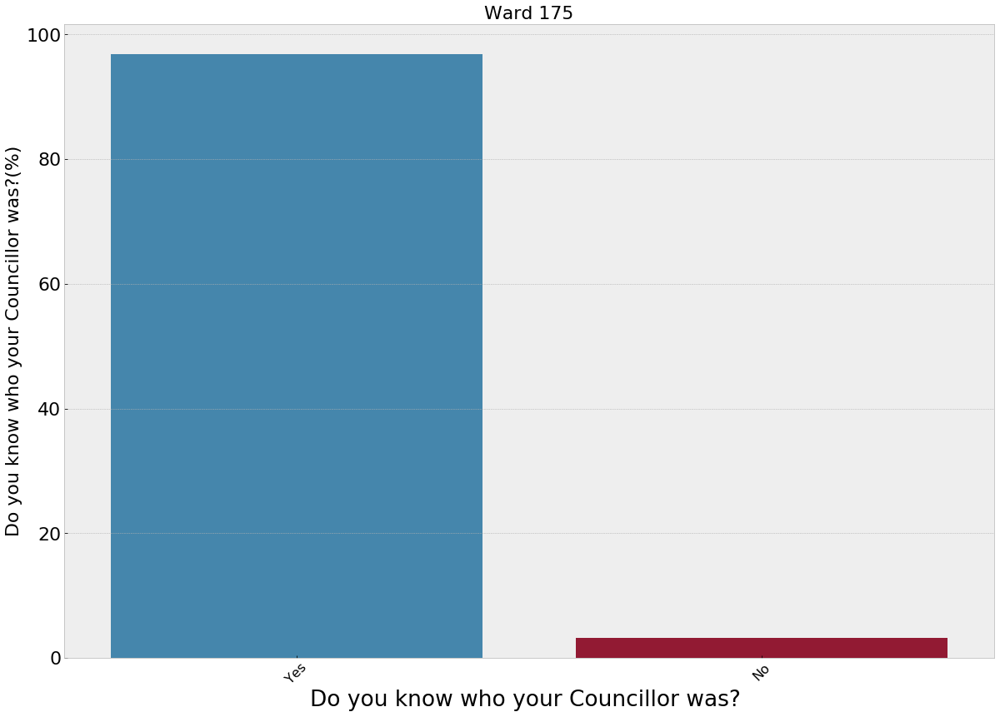

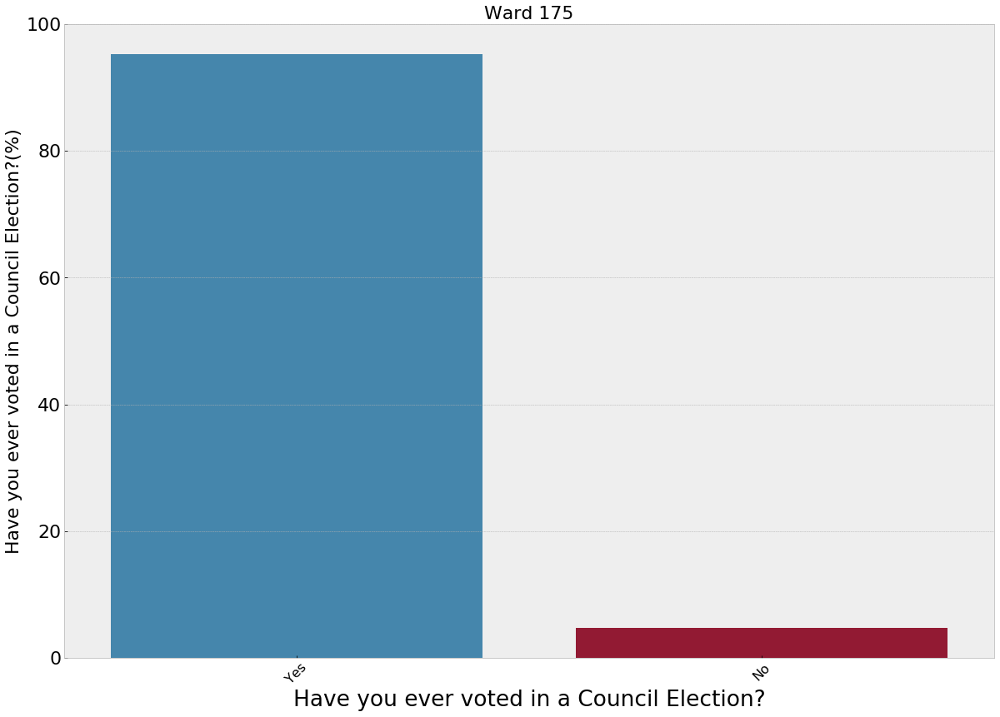

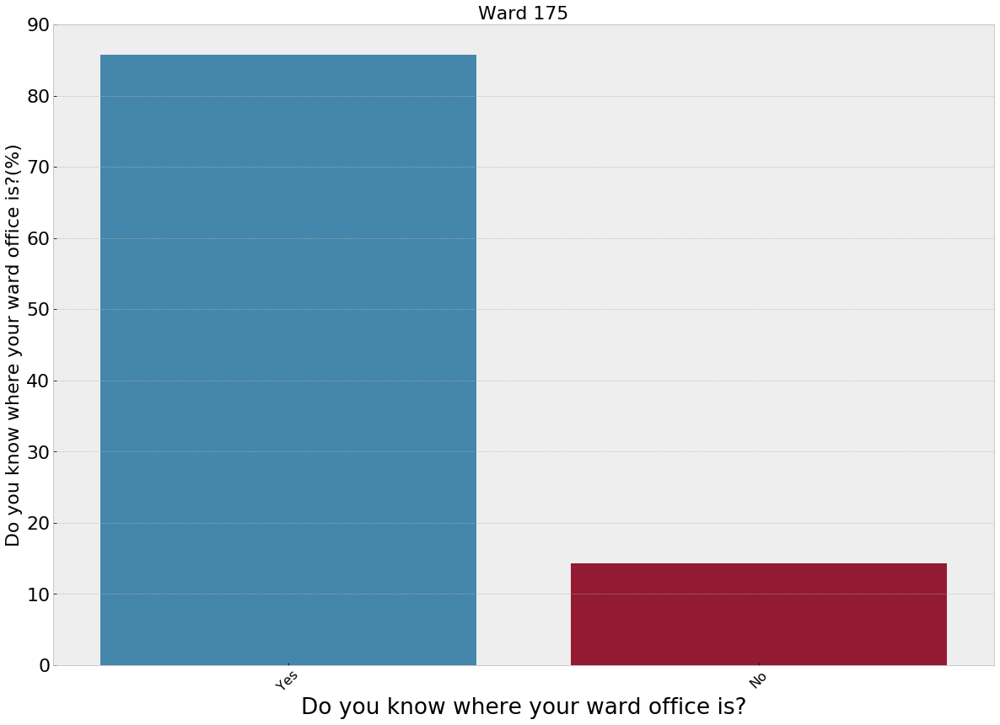

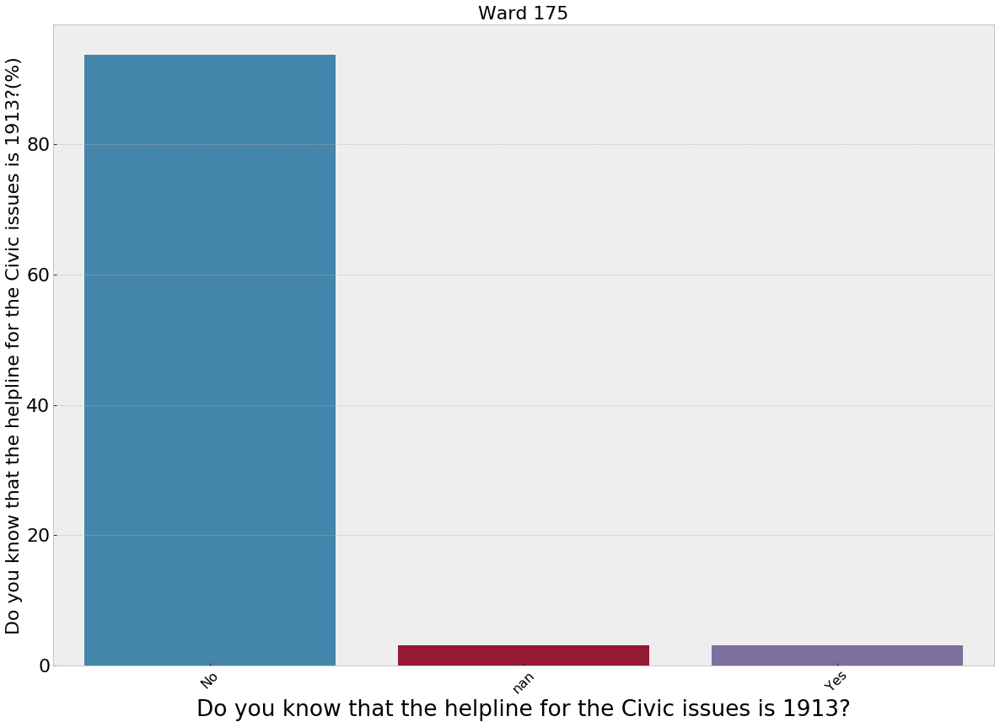

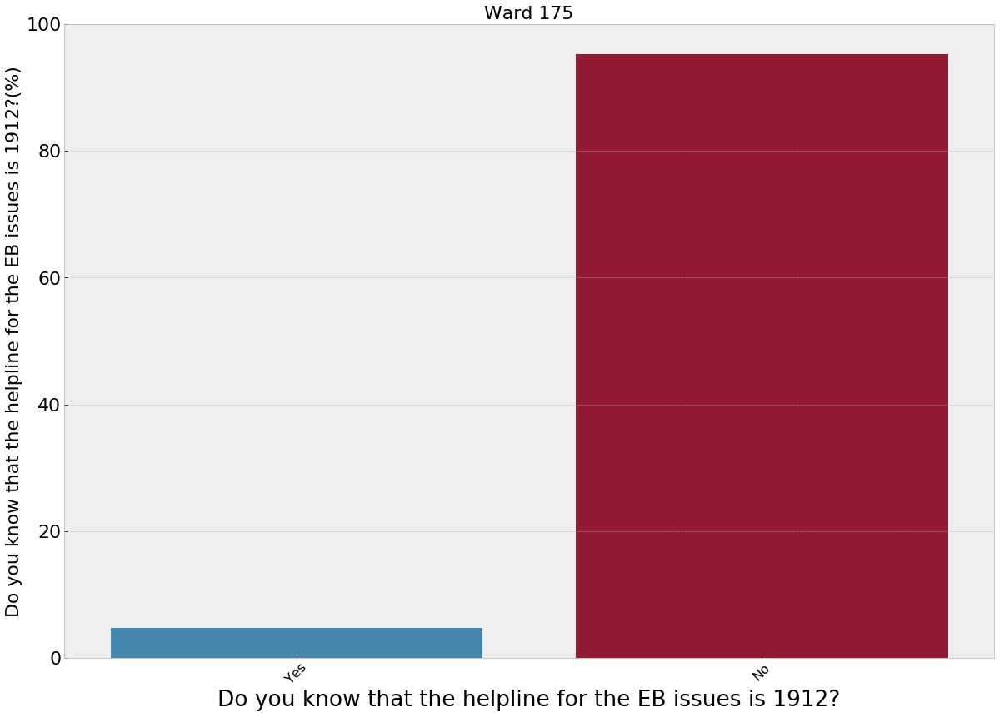

...

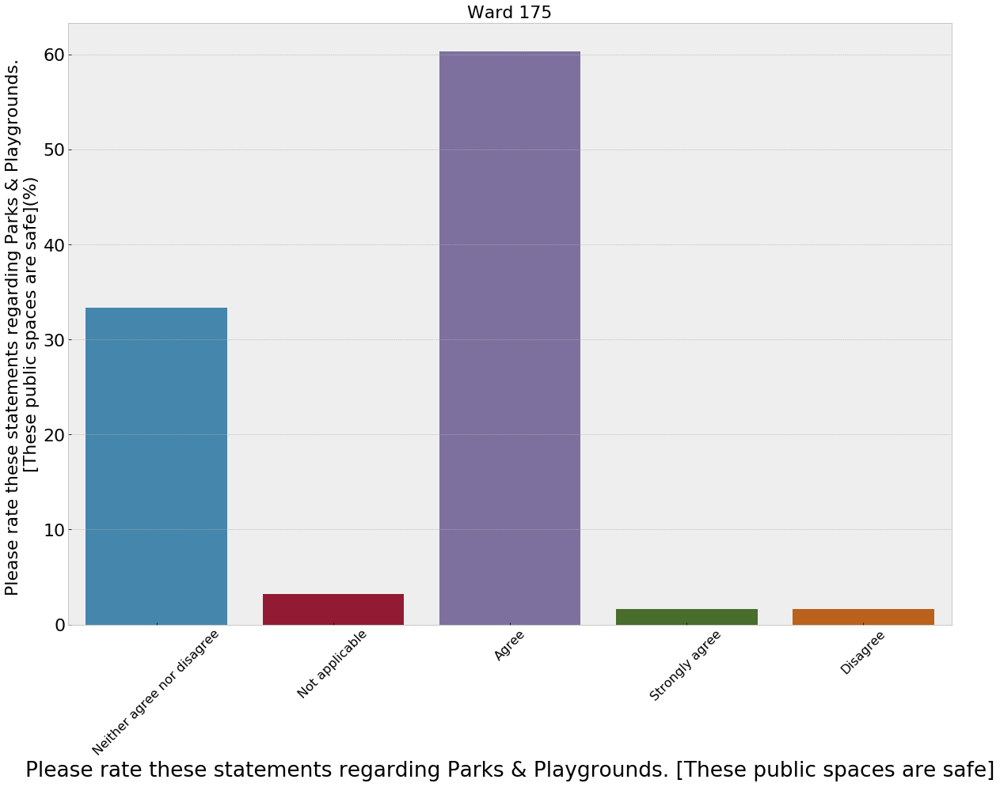

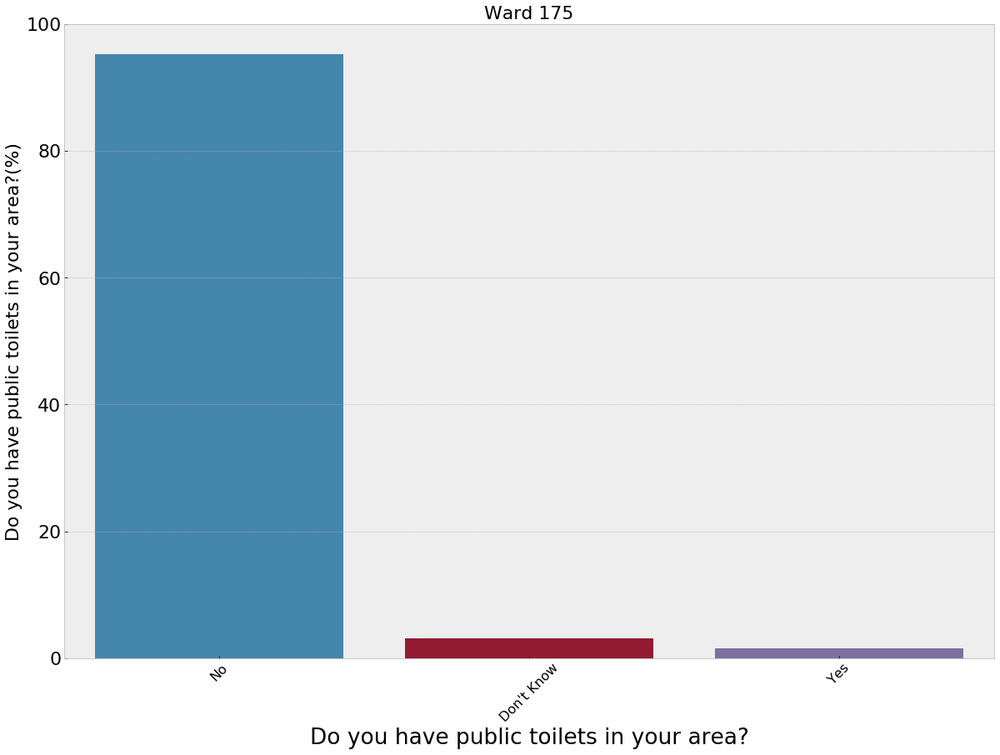

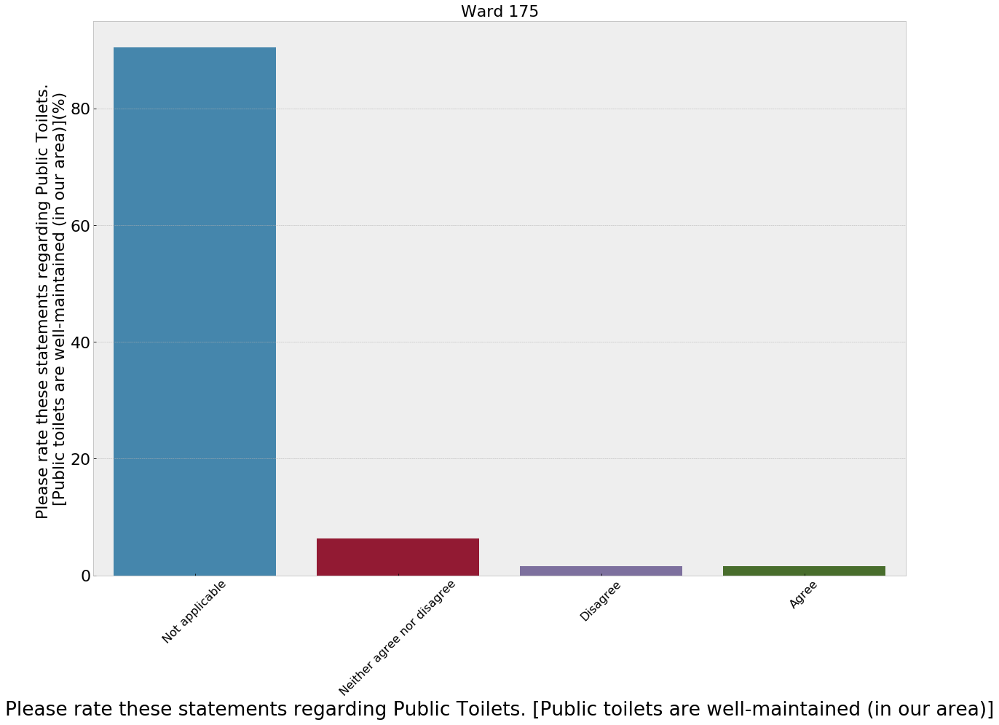

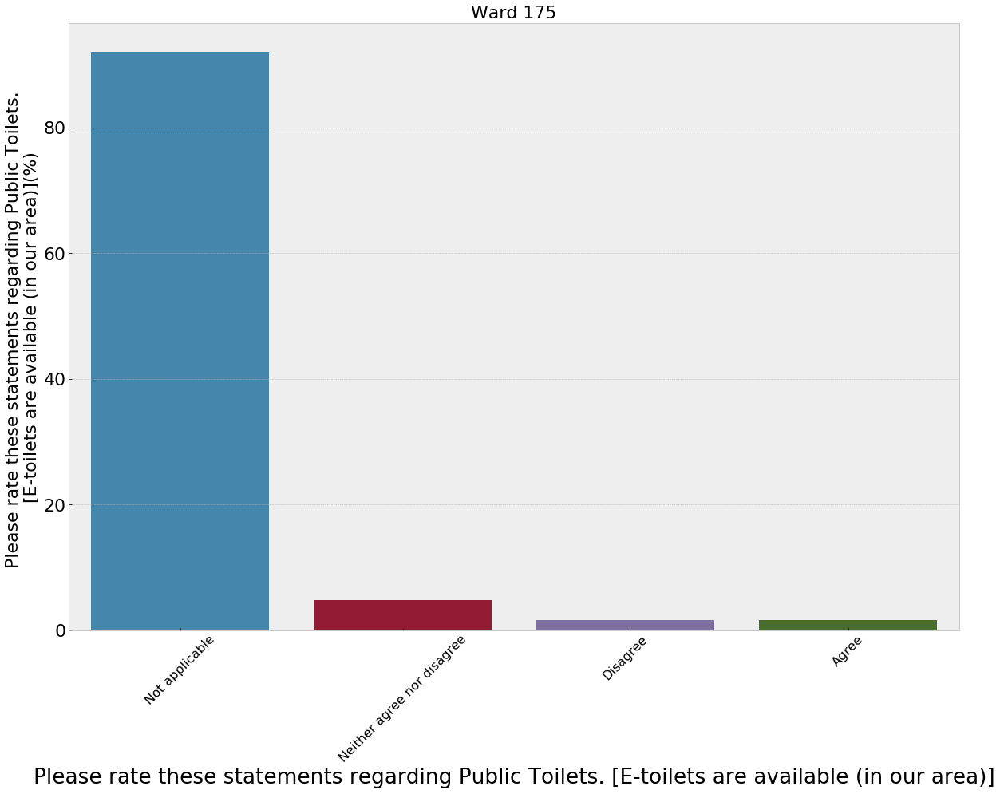

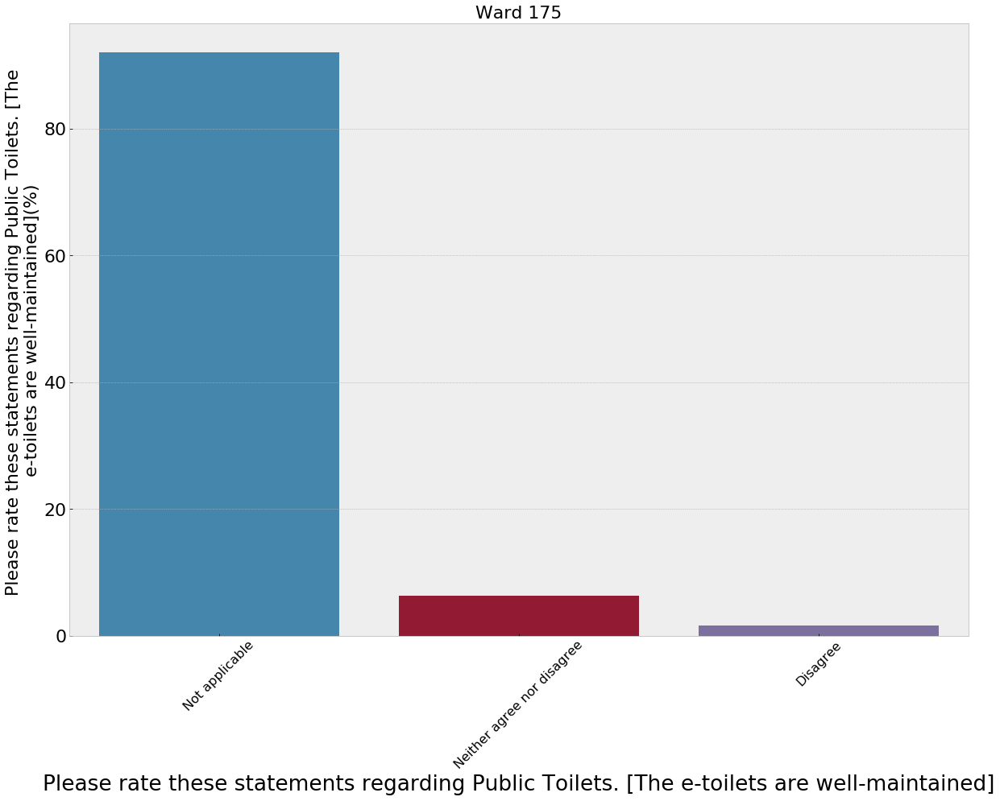

In [9]:
for colname in ward_175.columns[13:152]:
    plot_column(col=colname, data=ward_175, ward='175')